In [154]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
import numpy as np
import pandas as pd
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import cartopy.feature as cfeat
from collections import defaultdict

def load_monthly_predictions(month, year, model_name, folder, space_buffer, threshold):
    """
    Charge les prédictions journalières TCHLA pour un mois donné et retourne les moyennes mensuelles.
    """
    data_dict = defaultdict(list)
    
    for day in range(1, 32):
        try:
            file_path = os.path.join(folder, f'{day}/boxcox_prediction_space_{space_buffer}_20025{day}_t_{threshold}.pt')
            if space_buffer == "OCCCI": 
                file_path = os.path.join(folder, f'{day}/prediction_CHL_space_16_20025{day}.pt')
            prediction = torch.load(file_path)

            lat = prediction[:, 0].to('cpu').numpy()
            lon = prediction[:, 1].to('cpu').numpy()
            tchla_day = prediction[:, 2].to('cpu').numpy()

            for la, lo, val in zip(lat, lon, tchla_day):
                key = (round(la, 4), round(lo, 4))
                data_dict[key].append(val)

        except FileNotFoundError:
            print(f"Fichier manquant pour le jour {day}, ignoré.")
            continue

    latitudes = []
    longitudes = []
    tchla_means = []

    for (la, lo), values in data_dict.items():
        latitudes.append(la)
        longitudes.append(lo)
        tchla_means.append(np.nanmean(values))

    return np.array(latitudes), np.array(longitudes), np.array(tchla_means)

def plot_predictions(longitudes, latitudes, values, title):
    """
    Affiche les prédictions TCHLA sur une carte avec Cartopy.
    """
    fig = plt.figure(figsize=(12, 6))
    ax = plt.axes(projection=ccrs.PlateCarree())

    norm = mcolors.LogNorm(vmin=0.01, vmax=8)

    ax.add_feature(cfeat.LAND, facecolor='lightgray')
    ax.coastlines(color='gray')

    # Ajouter des points
    scatter = ax.scatter(longitudes, latitudes, c=values, cmap='viridis', s=1,
                         transform=ccrs.PlateCarree(), norm=norm)

    # Barre de couleur
    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.3, aspect=30)
    cbar.set_label('Prediction TCHLA (mg.m-3)')
    cbar.set_ticks([0.01, 0.03, 0.1, 0.3, 1, 3, 5, 8])
    cbar.set_ticklabels(['0.01', '0.03', '0.1', '0.3', '1', '3', '5', '8'])

    # Ajouter les lignes de latitude et longitude
    gl = ax.gridlines(draw_labels=True, linewidth=1, color='grey', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}

    plt.title(title, fontsize=14, weight='bold')
    plt.show()


def plot_predictions(longitudes, latitudes, values, title):
    """
    Affiche les prédictions TCHLA sur une carte avec Cartopy,
    avec une carte plus grande et une colorbar réduite.
    Ne montre pas les points dans la mer Noire.
    """
    # Masque pour retirer les NaNs et les points en mer Noire
    mask_valid = ~np.isnan(values)
    mask_black_sea = ~((longitudes >= 27) & (longitudes <= 42) &
                       (latitudes >= 40) & (latitudes <= 47))
    mask = mask_valid & mask_black_sea

    fig = plt.figure(figsize=(12, 6))  # Carte plus grande
    ax = plt.axes(projection=ccrs.PlateCarree())

    norm = mcolors.LogNorm(vmin=0.01, vmax=8)

    ax.add_feature(cfeat.LAND, facecolor='lightgray')
    ax.coastlines(color='gray')

    # Ajouter des points filtrés
    scatter = ax.scatter(longitudes[mask], latitudes[mask], c=values[mask],
                         cmap='viridis', s=1, transform=ccrs.PlateCarree(), norm=norm)

    # Barre de couleur réduite
    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.02, aspect=20, shrink=0.6)
    cbar.set_label('Prediction TCHLA (mg.m⁻³)')
    cbar.set_ticks([0.01, 0.03, 0.1, 0.3, 1, 3, 5, 8])
    cbar.set_ticklabels(['0.01', '0.03', '0.1', '0.3', '1', '3', '5', '8'])

    # Grilles
    gl = ax.gridlines(draw_labels=True, linewidth=1, color='grey', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}

    plt.title(title, fontsize=14, weight='bold')
    plt.show()


/tmp/ipykernel_1523032/1219166211.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  prediction = torch.load(file_path)


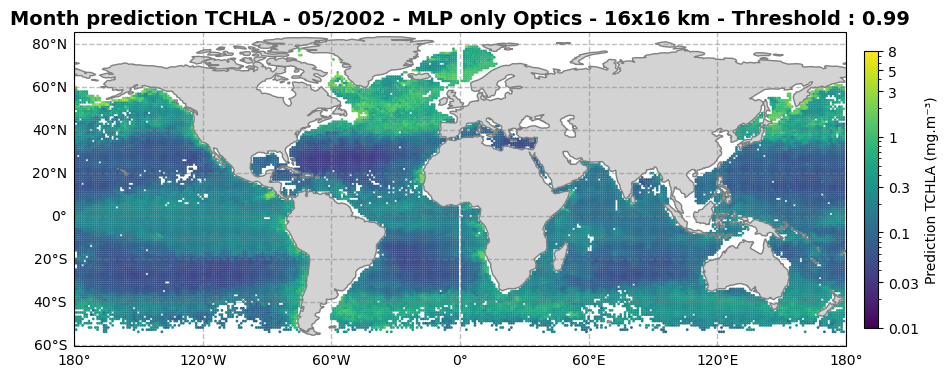

/tmp/ipykernel_1523032/1219166211.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  prediction = torch.load(file_path)


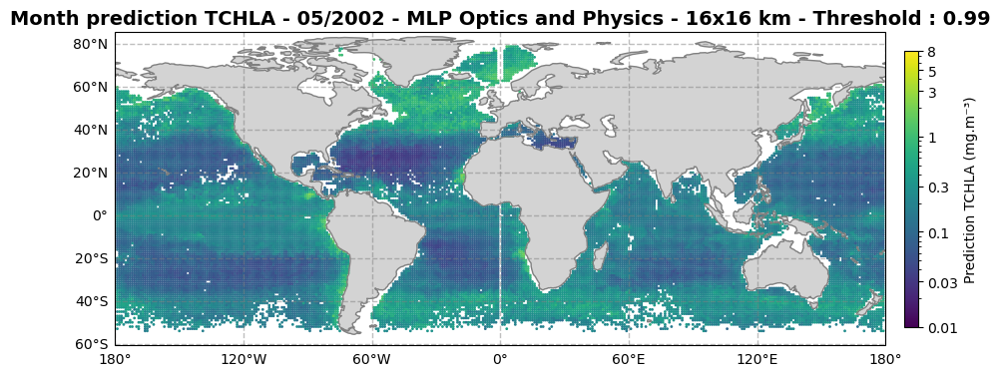

/tmp/ipykernel_1523032/1219166211.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  prediction = torch.load(file_path)


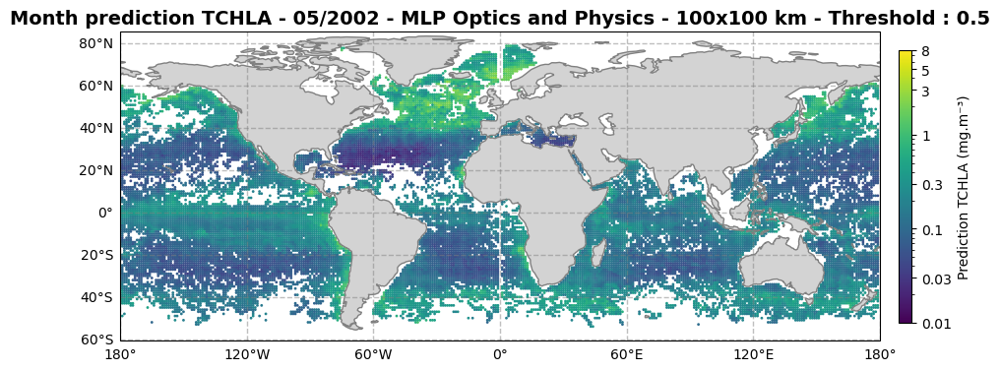

/tmp/ipykernel_1523032/1219166211.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  prediction = torch.load(file_path)


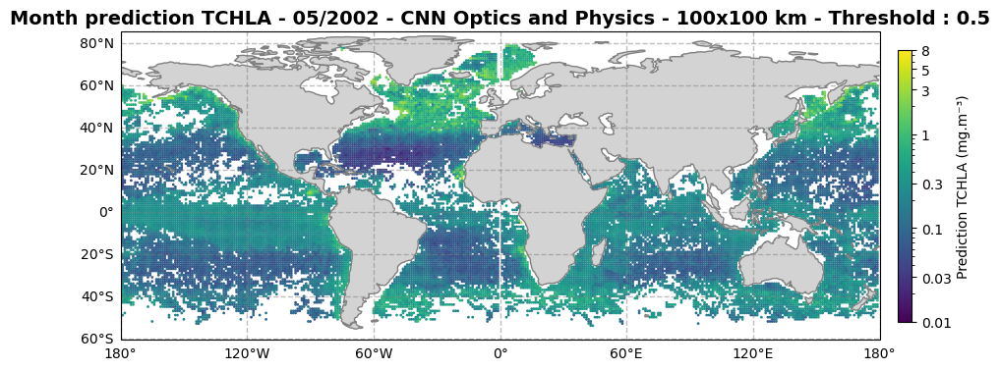

In [155]:
# Paramètres
month = 5
year = 2002

# ------ Space Buffer = 16 ------ #   
space_buffer = 8

threshold = 0.99
# MODEL 1 
model_name = "MLP_model1_after_EGU_0.99"
folder = f'/home/elabourdette/complex/share/save_training_Enza/inference/{year}/{month}/output/{model_name}'
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP only Optics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
latitudes_16_MLP1_099, longitudes_16_MLP1_099, tchla_means_16_MLP1_099 = load_monthly_predictions(month, year, model_name, folder, space_buffer, threshold)
plot_predictions(longitudes_16_MLP1_099, latitudes_16_MLP1_099, tchla_means_16_MLP1_099, title)

df_16_MLP1_099 = pd.DataFrame({
    'lon': longitudes_16_MLP1_099,
    'lat': latitudes_16_MLP1_099,
    'tchla': tchla_means_16_MLP1_099
})
min(tchla_means_16_MLP1_099)
# MODEL 2
model_name = "MLP_model2_after_EGU_0.99"
folder = f'/home/elabourdette/complex/share/save_training_Enza/inference/{year}/{month}/output/{model_name}'
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
latitudes_16_MLP2_099, longitudes_16_MLP2_099, tchla_means_16_MLP2_099 = load_monthly_predictions(month, year, model_name, folder, space_buffer, threshold)
plot_predictions(longitudes_16_MLP2_099, latitudes_16_MLP2_099, tchla_means_16_MLP2_099, title)

df_16_MLP2_099 = pd.DataFrame({
    'lon': longitudes_16_MLP2_099,
    'lat': latitudes_16_MLP2_099,
    'tchla': tchla_means_16_MLP2_099
})

# ------ Space Buffer = 100 ------ #   
space_buffer = 50

threshold = 0.5
# MODEL 2 
model_name = "MLP_model2_after_EGU_0.5"
folder = f'/home/elabourdette/complex/share/save_training_Enza/inference/{year}/{month}/output/{model_name}'
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
latitudes_100_MLP2_05, longitudes_100_MLP2_05, tchla_means_100_MLP2_05 = load_monthly_predictions(month, year, model_name, folder, space_buffer, threshold)
plot_predictions(longitudes_100_MLP2_05, latitudes_100_MLP2_05, tchla_means_100_MLP2_05, title)

df_100_MLP2_05 = pd.DataFrame({
    'lon': longitudes_100_MLP2_05,
    'lat': latitudes_100_MLP2_05,
    'tchla': tchla_means_100_MLP2_05
})

# CNN 2
model_name = "MLP_model3_after_EGU_0.5"
folder = f'/home/elabourdette/complex/share/save_training_Enza/inference/{year}/{month}/output/{model_name}'
title = f'Month prediction TCHLA - {month:02d}/{year} - CNN Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
latitudes_100_CNN2_05, longitudes_100_CNN2_05, tchla_means_100_CNN2_05 = load_monthly_predictions(month, year, model_name, folder, space_buffer, threshold)
plot_predictions(longitudes_100_CNN2_05, latitudes_100_CNN2_05, tchla_means_100_CNN2_05, title)

df_100_CNN2_05 = pd.DataFrame({
    'lon': longitudes_100_CNN2_05,
    'lat': latitudes_100_CNN2_05,
    'tchla': tchla_means_100_CNN2_05
})

/tmp/ipykernel_1523032/2585204658.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


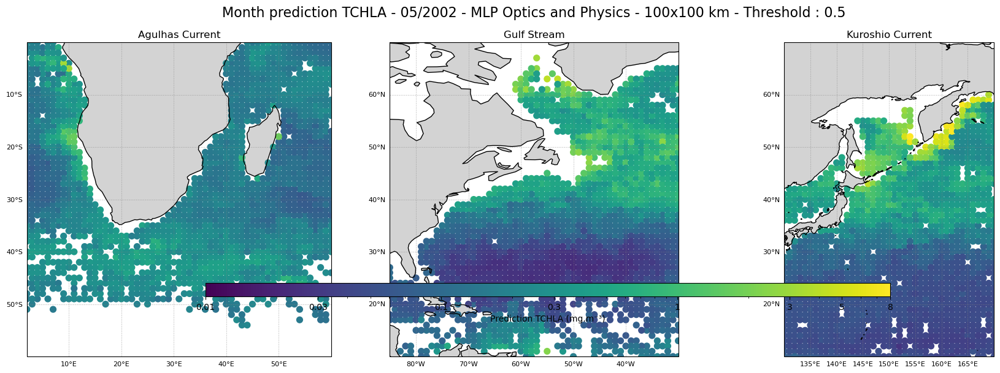

/tmp/ipykernel_1523032/2585204658.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


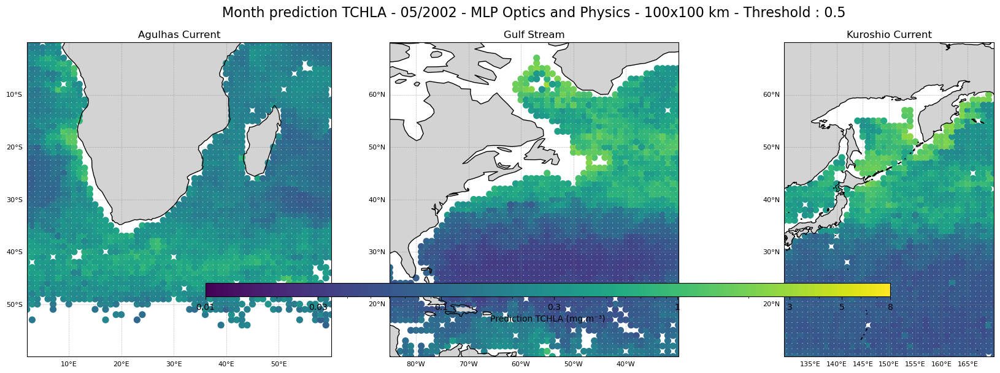

/tmp/ipykernel_1523032/2585204658.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


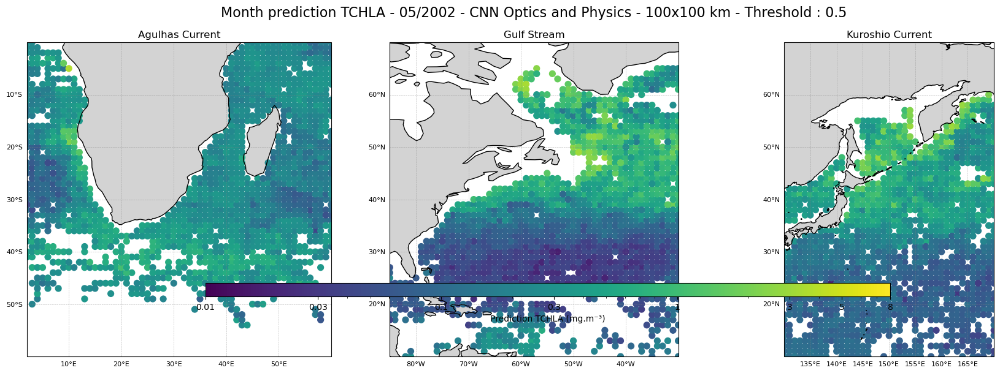

In [112]:
def plot_predictions_filtered(longitudes, latitudes, values, title):
    """
    Affiche les prédictions TCHLA pour Agulhas, Gulf Stream, et Kuroshio sur 3 cartes.
    """

    # Convertir en tableaux numpy pour faciliter le filtrage
    longitudes = np.array(longitudes)
    latitudes = np.array(latitudes)
    values = np.array(values)

    # Définition des régions (lon_min, lon_max, lat_min, lat_max)
    regions = {
        'Agulhas Current':    [2, 60, -60, -0],       # Sud-est Afrique
        'Gulf Stream':        [-85, -30, 10, 70],       # Côté Est des USA
        'Kuroshio Current':   [130, 170, 10, 70],       # Côté Est du Japon
    }

    norm = mcolors.LogNorm(vmin=0.01, vmax=8)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    fig.suptitle(title, fontsize=16)

    for ax, (region_name, (lon_min, lon_max, lat_min, lat_max)) in zip(axes, regions.items()):
        # Filtrer les données
        mask = (
            (longitudes >= lon_min) & (longitudes <= lon_max) &
            (latitudes >= lat_min) & (latitudes <= lat_max)
        )
        lons_region = longitudes[mask]
        lats_region = latitudes[mask]
        vals_region = values[mask]

        # Carte et données
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.add_feature(cfeat.LAND, facecolor='lightgray')
        ax.coastlines(color='black')

        scatter = ax.scatter(lons_region, lats_region, c=vals_region, cmap='viridis', s=50,
                             transform=ccrs.PlateCarree(), norm=norm)

        # Grilles
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 8}
        gl.ylabel_style = {'size': 8}

        ax.set_title(region_name)

    # Barre de couleur commune
    cbar = fig.colorbar(
    scatter,
    ax=axes.ravel().tolist(),
    orientation='horizontal',
    pad=0.1,
    aspect=50,
    shrink=0.8)
    cbar.set_label('Prediction TCHLA (mg.m⁻³)')
    cbar.set_ticks([0.01, 0.03, 0.1, 0.3, 1, 3, 5, 8])
    cbar.set_ticklabels(['0.01', '0.03', '0.1', '0.3', '1', '3', '5', '8'])

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# MODEL 2 
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_predictions_filtered(longitudes_OCCCI, latitudes_OCCCI, tchla_means_OCCCI, title)

# MODEL 2 
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_predictions_filtered(longitudes_16_MLP1_099, latitudes_16_MLP1_099, tchla_means_16_MLP1_099, title)

# CNN 2
title = f'Month prediction TCHLA - {month:02d}/{year} - CNN Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_predictions_filtered(longitudes_100_CNN2_05, latitudes_100_CNN2_05, tchla_means_100_CNN2_05, title)

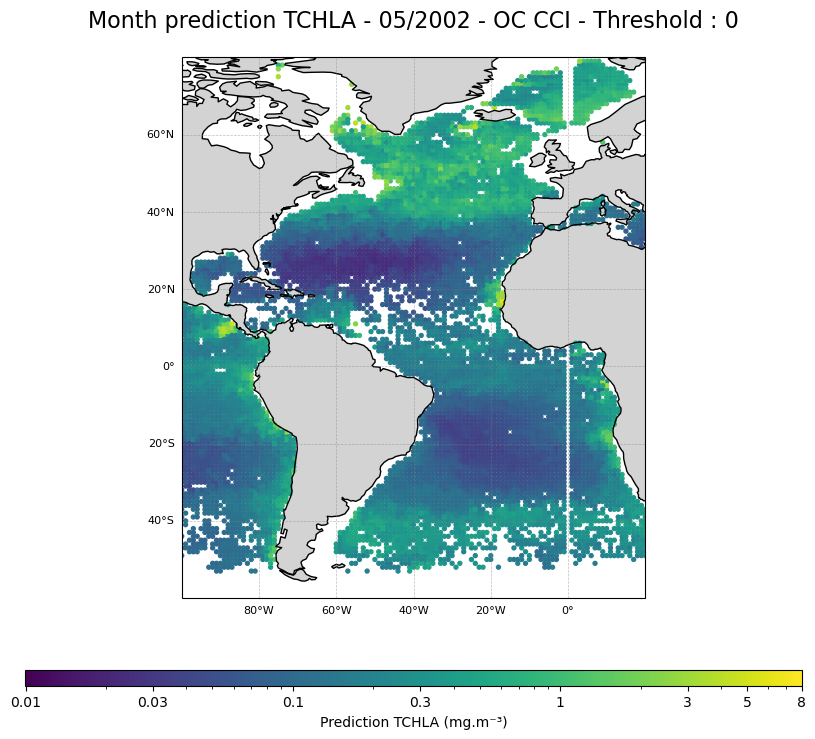

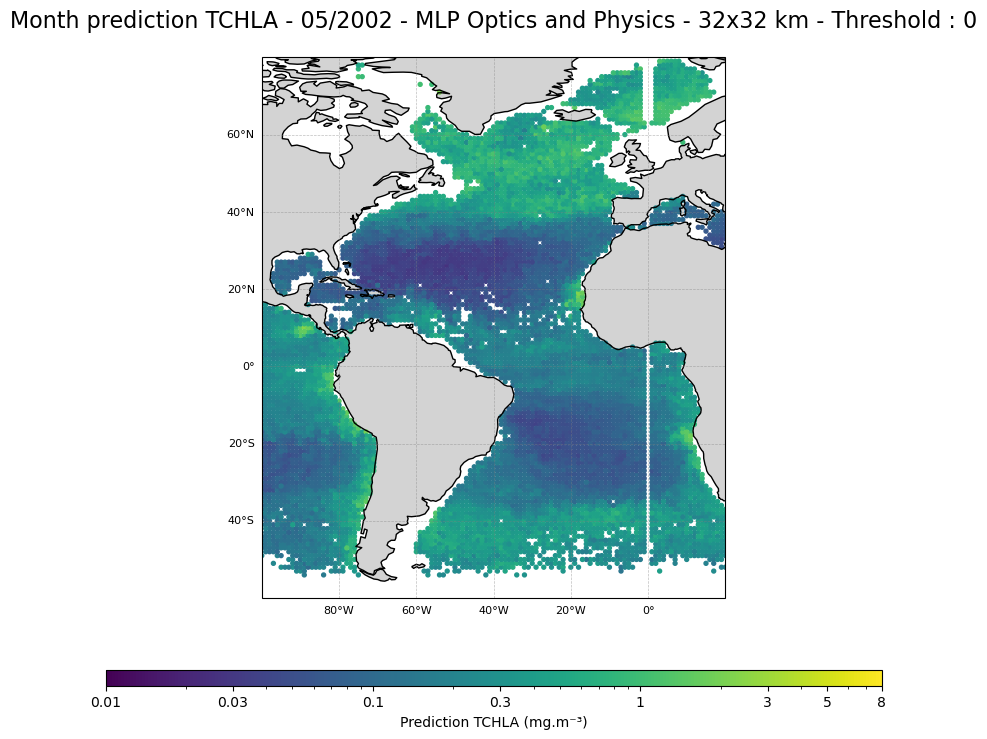

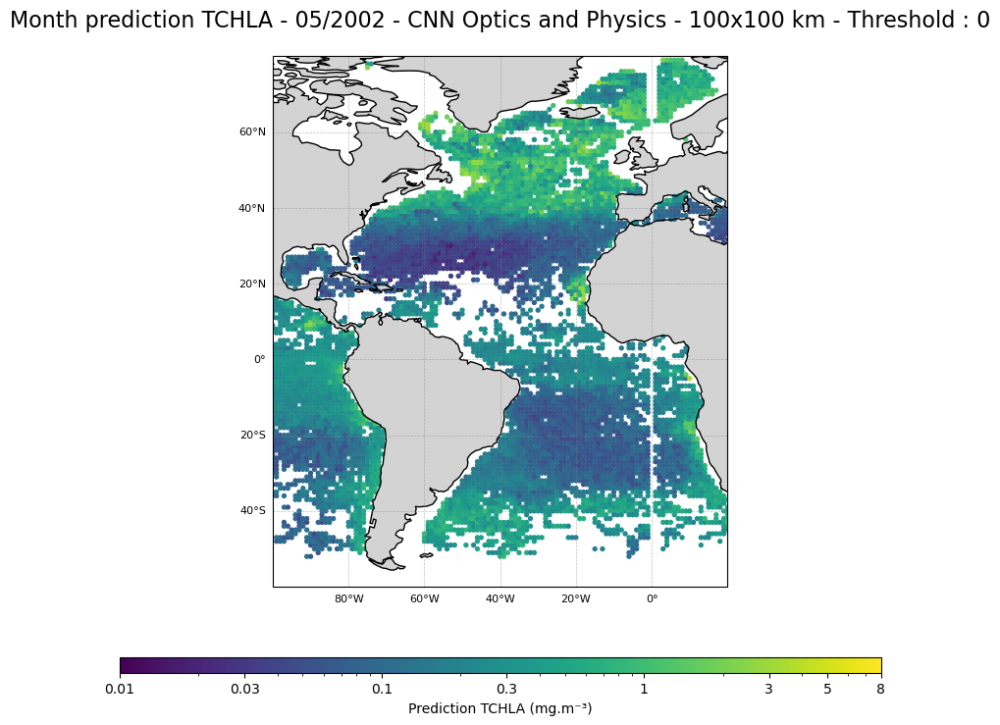

In [76]:
def plot_predictions_atlantic(longitudes, latitudes, values, title):
    """
    Affiche les prédictions TCHLA sur l'ensemble de l'océan Atlantique.
    """

    # Convertir en tableaux numpy
    longitudes = np.array(longitudes)
    latitudes = np.array(latitudes)
    values = np.array(values)

    # Définir les limites de l'océan Atlantique approximativement
    lon_min, lon_max = -100, 20     # De l'Amérique à l'Afrique
    lat_min, lat_max = -60, 80      # De l'Atlantique Sud au Nord

    # Normalisation des valeurs pour l'affichage
    norm = mcolors.LogNorm(vmin=0.01, vmax=8)

    # Créer une figure et un seul subplot
    fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    fig.suptitle(title, fontsize=16)

    # Filtrer les données dans la zone Atlantique
    mask = (
        (longitudes >= lon_min) & (longitudes <= lon_max) &
        (latitudes >= lat_min) & (latitudes <= lat_max)
    )
    lons_filtered = longitudes[mask]
    lats_filtered = latitudes[mask]
    vals_filtered = values[mask]

    # Carte de fond
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.add_feature(cfeat.LAND, facecolor='lightgray')
    ax.coastlines(color='black')

    # Nuage de points
    scatter = ax.scatter(lons_filtered, lats_filtered, c=vals_filtered, cmap='viridis', s=8,
                         transform=ccrs.PlateCarree(), norm=norm)

    # Grilles
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8}

    # Barre de couleur
    cbar = fig.colorbar(
        scatter,
        ax=ax,
        orientation='horizontal',
        pad=0.1,
        aspect=50,
        shrink=0.8
    )
    cbar.set_label('Prediction TCHLA (mg.m⁻³)')
    cbar.set_ticks([0.01, 0.03, 0.1, 0.3, 1, 3, 5, 8])
    cbar.set_ticklabels(['0.01', '0.03', '0.1', '0.3', '1', '3', '5', '8'])

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
title = f'Month prediction TCHLA - {month:02d}/{year} - OC CCI - Threshold : {threshold}'
plot_predictions_atlantic(longitudes_OCCCI, latitudes_OCCCI, tchla_means_OCCCI, title)

space_buffer = 16
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_predictions_atlantic(longitudes_16_MLP2_099, latitudes_16_MLP2_099, tchla_means_16_MLP2_099, title)

space_buffer = 50
title = f'Month prediction TCHLA - {month:02d}/{year} - CNN Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_predictions_atlantic(longitudes_100_CNN2_05, latitudes_100_CNN2_05, tchla_means_100_CNN2_05, title)

In [72]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeat
import numpy as np

def plot_predictions_low_mesoscale(longitudes, latitudes, values, title):
    """
    Affiche les prédictions TCHLA pour des zones à faible activité à méso-échelle
    (exclut l'océan Austral).
    """

    longitudes = np.array(longitudes)
    latitudes = np.array(latitudes)
    values = np.array(values)

    # Zones à faible activité méso-échelle (sans océan Austral)
    regions = {
        'Gyre Atlantique Sud': [-40, -10, -30, -10],
        'Pacifique équatorial': [-160, -130, -5, 5],
    }

    norm = mcolors.LogNorm(vmin=0.01, vmax=8)

    fig, axes = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    fig.suptitle(title, fontsize=16)

    for ax, (region_name, (lon_min, lon_max, lat_min, lat_max)) in zip(axes, regions.items()):
        mask = (
            (longitudes >= lon_min) & (longitudes <= lon_max) &
            (latitudes >= lat_min) & (latitudes <= lat_max)
        )
        lons_region = longitudes[mask]
        lats_region = latitudes[mask]
        vals_region = values[mask]

        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.add_feature(cfeat.LAND, facecolor='lightgray')
        ax.coastlines(color='black')

        scatter = ax.scatter(lons_region, lats_region, c=vals_region, cmap='viridis', s=50,
                             transform=ccrs.PlateCarree(), norm=norm)

        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 8}
        gl.ylabel_style = {'size': 8}
        ax.set_title(region_name)

    # Colorbar en bas
    cbar = fig.colorbar(
        scatter,
        ax=axes.ravel().tolist(),
        orientation='horizontal',
        pad=0.1,
        aspect=50,
        shrink=0.8
    )
    cbar.set_label('Prediction TCHLA (mg.m⁻³)')
    cbar.set_ticks([0.01, 0.03, 0.1, 0.3, 1, 3, 5, 8])
    cbar.set_ticklabels(['0.01', '0.03', '0.1', '0.3', '1', '3', '5', '8'])

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()


/tmp/ipykernel_1523032/3356713176.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


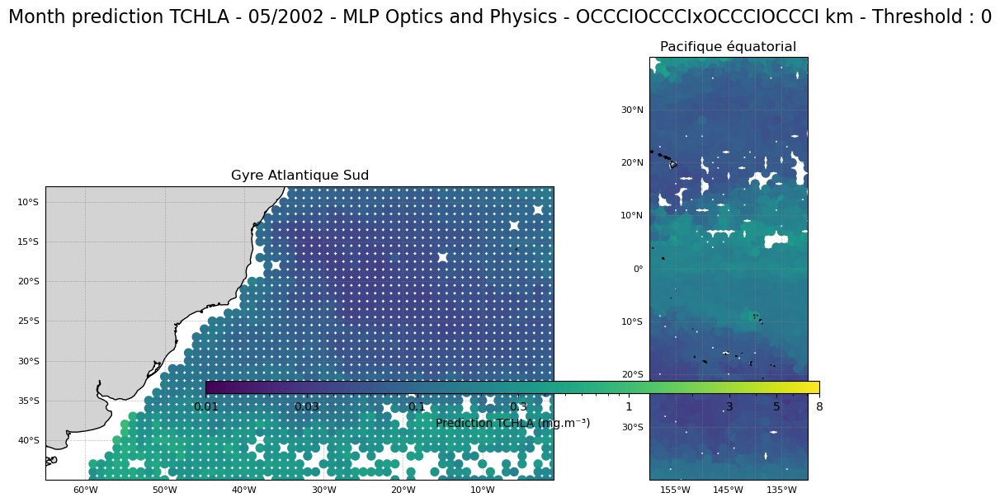

/tmp/ipykernel_1523032/3356713176.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


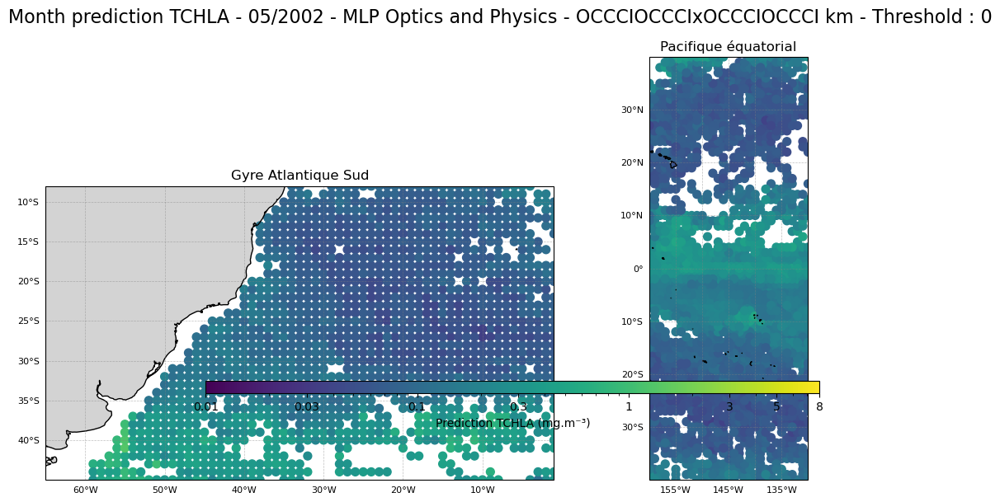

/tmp/ipykernel_1523032/3356713176.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


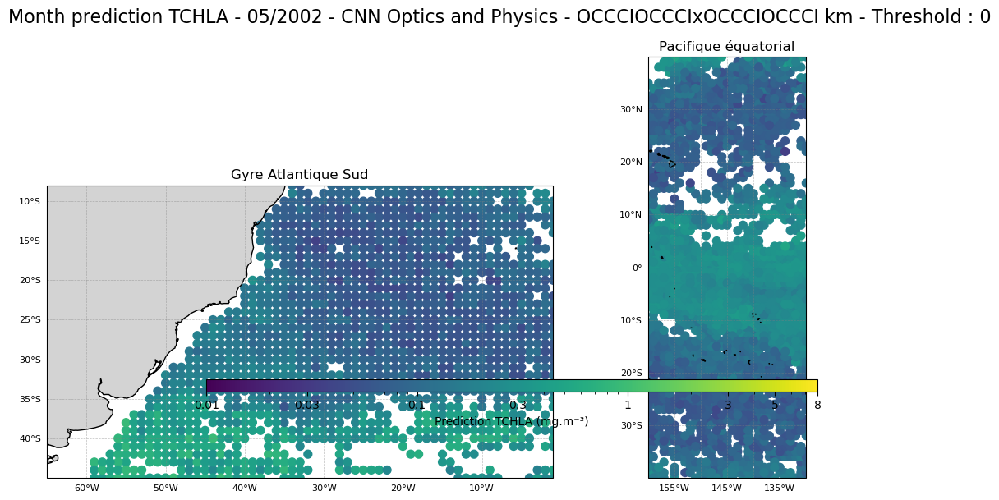

In [43]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeat
import numpy as np

def plot_predictions_low_mesoscale(longitudes, latitudes, values, title):
    """
    Affiche les prédictions TCHLA pour des zones à faible activité à méso-échelle
    (exclut l'océan Austral).
    """

    longitudes = np.array(longitudes)
    latitudes = np.array(latitudes)
    values = np.array(values)

    # Zones à faible activité méso-échelle (sans océan Austral)
    regions = {
        'Gyre Atlantique Sud': [-65, -1, -45, -8],
        'Pacifique équatorial': [-160, -130, -40, 40],
    }

    norm = mcolors.LogNorm(vmin=0.01, vmax=8)

    fig, axes = plt.subplots(1, 2, figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    fig.suptitle(title, fontsize=16)

    for ax, (region_name, (lon_min, lon_max, lat_min, lat_max)) in zip(axes, regions.items()):
        mask = (
            (longitudes >= lon_min) & (longitudes <= lon_max) &
            (latitudes >= lat_min) & (latitudes <= lat_max)
        )
        lons_region = longitudes[mask]
        lats_region = latitudes[mask]
        vals_region = values[mask]

        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.add_feature(cfeat.LAND, facecolor='lightgray')
        ax.coastlines(color='black')

        scatter = ax.scatter(lons_region, lats_region, c=vals_region, cmap='viridis', s=50,
                             transform=ccrs.PlateCarree(), norm=norm)

        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 8}
        gl.ylabel_style = {'size': 8}
        ax.set_title(region_name)

    # Colorbar en bas
    cbar = fig.colorbar(
        scatter,
        ax=axes.ravel().tolist(),
        orientation='horizontal',
        pad=0.1,
        aspect=50,
        shrink=0.8
    )
    cbar.set_label('Prediction TCHLA (mg.m⁻³)')
    cbar.set_ticks([0.01, 0.03, 0.1, 0.3, 1, 3, 5, 8])
    cbar.set_ticklabels(['0.01', '0.03', '0.1', '0.3', '1', '3', '5', '8'])

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()
# MODEL 2
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_predictions_low_mesoscale(longitudes_OCCCI, latitudes_OCCCI, tchla_means_OCCCI, title)

# MODEL 2 bis
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_predictions_low_mesoscale(longitudes_100_MLP2_05, latitudes_100_MLP2_05, tchla_means_100_MLP2_05, title)

# CNN 2
title = f'Month prediction TCHLA - {month:02d}/{year} - CNN Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_predictions_low_mesoscale(longitudes_100_CNN2_05, latitudes_100_CNN2_05, tchla_means_100_CNN2_05, title)

In [64]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeat
import numpy as np

def plot_specific_predictions(longitudes, latitudes, values, title):

    longitudes = np.array(longitudes)
    latitudes = np.array(latitudes)
    values = np.array(values)

    # Définition du Gulf Stream
    region_name = 'Gulf Stream'
    lon_min, lon_max, lat_min, lat_max = -70, -90,-45, -5

    norm = mcolors.LogNorm(vmin=0.01, vmax=8)

    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    fig.suptitle(title, fontsize=16)

    # Masquer les données hors région
    mask = (
        (longitudes >= lon_min) & (longitudes <= lon_max) &
        (latitudes >= lat_min) & (latitudes <= lat_max)
    )
    lons_region = longitudes[mask]
    lats_region = latitudes[mask]
    vals_region = values[mask]

    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.add_feature(cfeat.LAND, facecolor='lightgray')
    ax.coastlines(color='black')

    scatter = ax.scatter(lons_region, lats_region, c=vals_region, cmap='viridis', s=25,
                         transform=ccrs.PlateCarree(), norm=norm)

    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8}
    ax.set_title(region_name)

    # Barre de couleur
    cbar = fig.colorbar(
        scatter,
        ax=ax,
        orientation='horizontal',
        pad=0.1,
        aspect=40,
        shrink=0.8
    )
    cbar.set_label('Prediction TCHLA (mg.m⁻³)')
    cbar.set_ticks([0.01, 0.03, 0.1, 0.3, 1, 3, 5, 8])
    cbar.set_ticklabels(['0.01', '0.03', '0.1', '0.3', '1', '3', '5', '8'])

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()


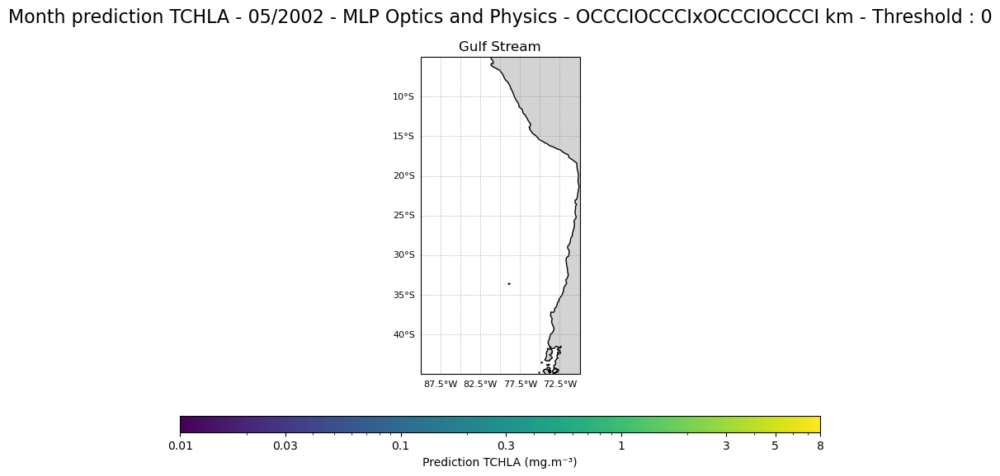

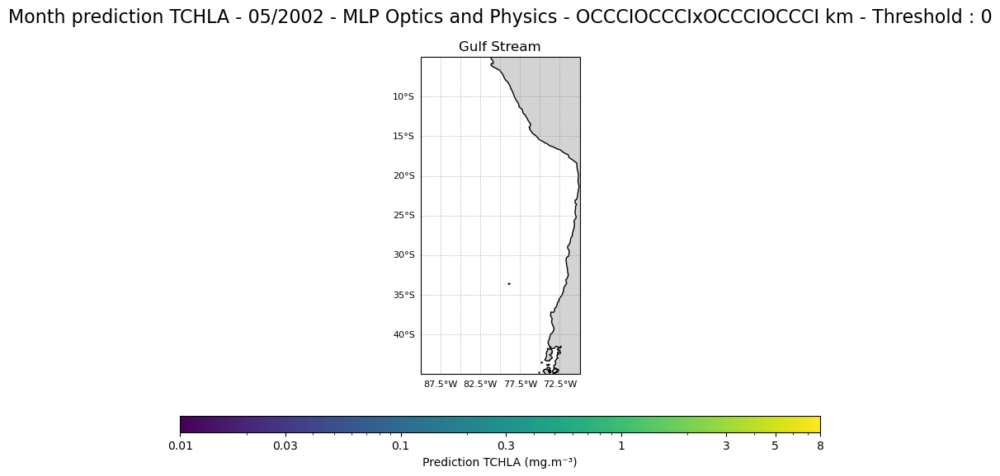

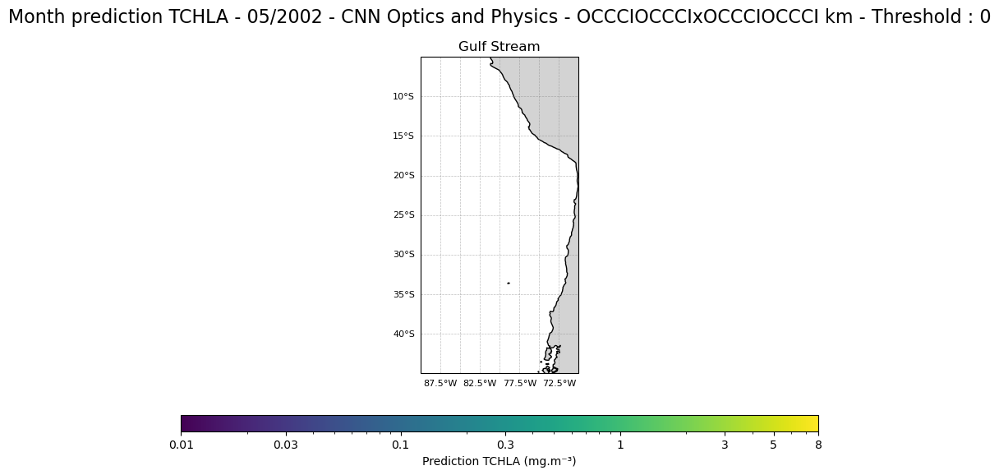

In [65]:
# MODEL 2
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_specific_predictions(longitudes_OCCCI, latitudes_OCCCI, tchla_means_OCCCI, title)

# MODEL 2 bis
title = f'Month prediction TCHLA - {month:02d}/{year} - MLP Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_specific_predictions(longitudes_100_MLP2_05, latitudes_100_MLP2_05, tchla_means_100_MLP2_05, title)

# CNN 2
title = f'Month prediction TCHLA - {month:02d}/{year} - CNN Optics and Physics - {space_buffer*2}x{space_buffer*2} km - Threshold : {threshold}'
plot_specific_predictions(longitudes_100_CNN2_05, latitudes_100_CNN2_05, tchla_means_100_CNN2_05, title)

/tmp/ipykernel_1523032/1099059484.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  prediction = torch.load(file_path)


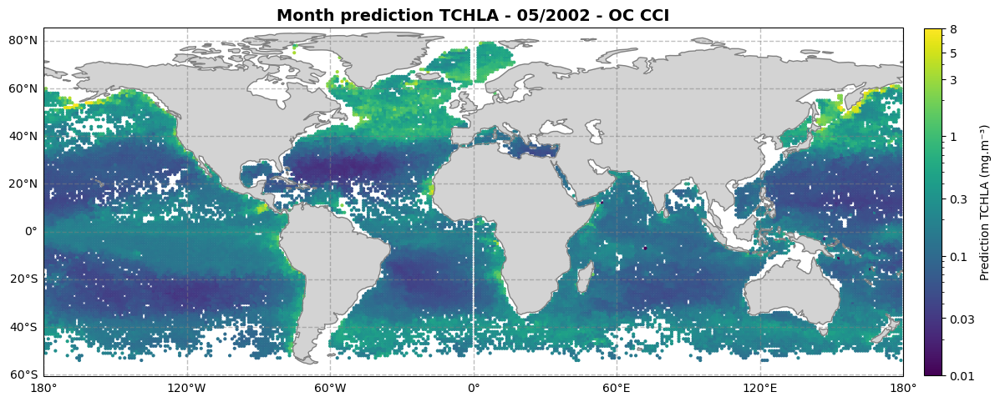

In [149]:
# ------ OC CCI ------ # 
# OC CCI
model_name = 'OCCCI'
space_buffer = 'OCCCI'
threshold = 0
folder = f'/home/elabourdette/complex/share/save_training_Enza/inference/{year}/{month}/output/{model_name}'
title = f'Month prediction TCHLA - {month:02d}/{year} - OC CCI'
latitudes_OCCCI, longitudes_OCCCI, tchla_means_OCCCI = load_monthly_predictions(month, year, 'OCCCI', folder, space_buffer, threshold)
plot_predictions(longitudes_OCCCI, latitudes_OCCCI, tchla_means_OCCCI, title)
df_OCCCI = pd.DataFrame({
    'lon': longitudes_OCCCI,
    'lat': latitudes_OCCCI,
    'tchla': tchla_means_OCCCI
})

In [129]:
df_add_deep_099 = pd.merge(df_16_MLP1_099, df_OCCCI, on=['lon', 'lat'], how='inner')
df_add_deep_add_physics_099 = pd.merge(df_16_MLP2_099, df_OCCCI, on=['lon', 'lat'], how='inner')
df_add_physics_099 = pd.merge(df_16_MLP2_099, df_16_MLP1_099, on=['lon', 'lat'], how='inner')

In [130]:
# Fonctions de différence
def compute_diff(row):
    if np.isnan(row['tchla_x']) or np.isnan(row['tchla_y']):
        return np.nan
    return row['tchla_y'] - row['tchla_x']

def compute_relative_diff(row):
    if np.isnan(row['tchla_x']) or np.isnan(row['tchla_y']):
        return np.nan
    if row['tchla_y'] == 0:
        return np.nan
    return (row['tchla_y'] - row['tchla_x']) / row['tchla_y']

def compute_log_relative_diff(row):
    x = row['tchla_x']
    y = row['tchla_y']
    if np.isnan(x) or np.isnan(y) or x <= 0 or y <= 0:
        return np.nan
    return (np.log(y) - np.log(x)) / (np.log(y))

# Liste des DataFrames à traiter
dfs = [
    df_add_deep_099,
    df_add_deep_add_physics_099,
    df_add_physics_099
]

# Application des fonctions à chaque DataFrame
for df in dfs:
    df['diff'] = df.apply(compute_diff, axis=1)
    df['diff_frac'] = df.apply(compute_relative_diff, axis=1)
    df['diff_frac_log'] = df.apply(compute_log_relative_diff, axis=1)


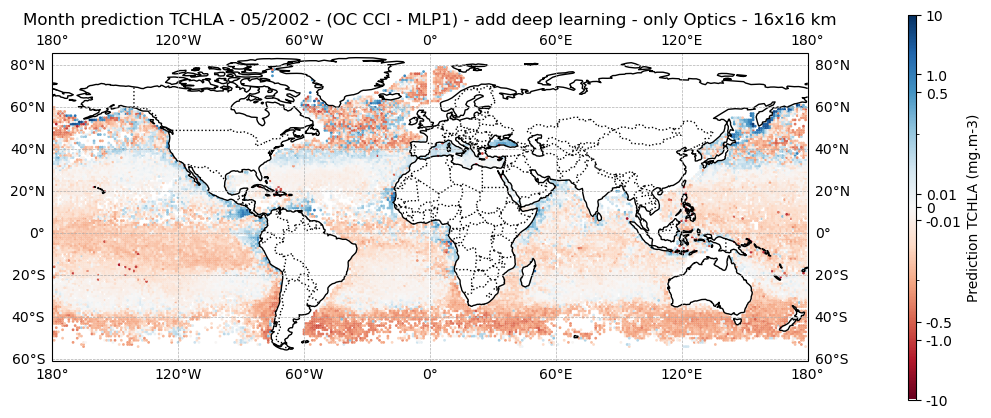

<Figure size 640x480 with 0 Axes>

In [131]:
def plot_predictions_difference(ax, longitudes, latitudes, values, title):
    # Using SymLogNorm with a range of -10 to 10
    norm = mcolors.SymLogNorm(linthresh=0.01, linscale=0.2, vmin=-10, vmax=10)

    # Creating the scatter plot with the modified color scale and colormap
    scatter = ax.scatter(longitudes, latitudes, c=values, cmap='RdBu', s=1, 
                         transform=ccrs.PlateCarree(), norm=norm)

    ax.coastlines(resolution='110m', color='black')
    ax.add_feature(cfeat.BORDERS, linestyle=':', edgecolor='black')
    ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5)
    ax.set_title(title) 
    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.1, aspect=50)
    cbar.set_label('Prediction TCHLA (mg.m-3)')
    # Custom tick locations
    cbar.set_ticks([-10, -1.0, -0.5, -0.01, 0, 0.01, 0.5, 1.0, 10])
    cbar.set_ticklabels(['-10','-1.0', '-0.5', '-0.01', '0', '0.01', '0.5','1.0', '10'])

    plt.title(title)
    plt.show()
fig = plt.figure(figsize=(13, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
plot_predictions_difference(
    ax,
    df_add_deep_099['lon'].values,
    df_add_deep_099['lat'].values,
    df_add_deep_099['diff'].values,
    title=f'Month prediction TCHLA - {month:02d}/{year} - (OC CCI - MLP1) - add deep learning - only Optics - 16x16 km'
)
plt.tight_layout()
plt.show()

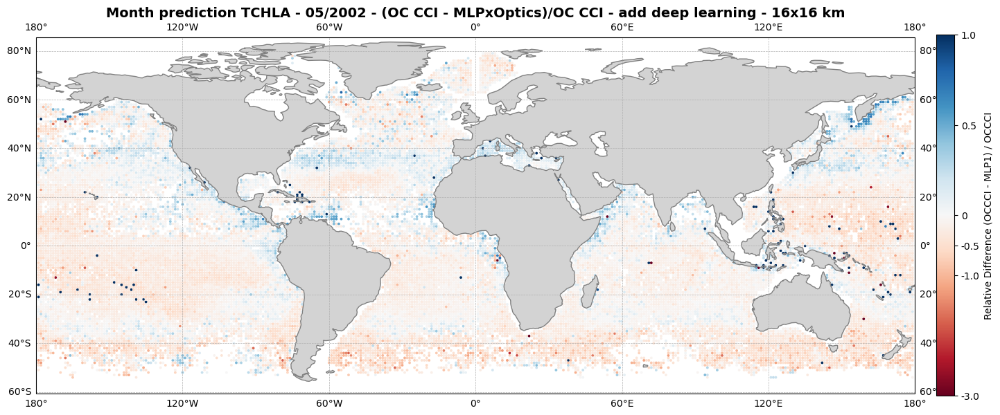

In [150]:
from matplotlib.colors import TwoSlopeNorm

def plot_predictions_difference_frac(ax, longitudes, latitudes, values, title):
    # Masquer les NaN
    mask = ~np.isnan(values)

    # Masquer la Mer Noire (approximativement entre 27E-42E et 40N-47N)
    black_sea_mask = ~((longitudes >= 27) & (longitudes <= 42) &
                       (latitudes >= 40) & (latitudes <= 47))

    # Masque combiné
    mask = mask & black_sea_mask
    # Norme centrée sur 0, avec min=-3 et max=1
    norm = TwoSlopeNorm(vmin=-3, vcenter=0, vmax=1)

    scatter = ax.scatter(
        longitudes[mask], latitudes[mask],
        c=values[mask], cmap='RdBu', s=3,
        transform=ccrs.PlateCarree(), norm=norm
    )
    
    ax.add_feature(cfeat.LAND, facecolor='lightgray')
    ax.coastlines(color='gray')

    ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5)
    ax.set_title(title, fontsize=14, weight='bold')

    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.02, aspect=20, shrink=0.6)
    cbar.set_label('Relative Difference (OCCCI - MLP1) / OCCCI')
    cbar.set_ticks([-3.0, -1.0, -0.5, 0, 0.5, 1.0])
    cbar.set_ticklabels(['-3.0', '-1.0', '-0.5', '0', '0.5', '1.0'])
    
fig = plt.figure(figsize=(16, 9))
ax = plt.axes(projection=ccrs.PlateCarree())
plot_predictions_difference_frac(
    ax,
    df_add_deep_099['lon'].values,
    df_add_deep_099['lat'].values,
    df_add_deep_099['diff_frac'].values,
    title=f'Month prediction TCHLA - {month:02d}/{year} - (OC CCI - MLPxOptics)/OC CCI - add deep learning - 16x16 km'
)
plt.tight_layout()
plt.show()



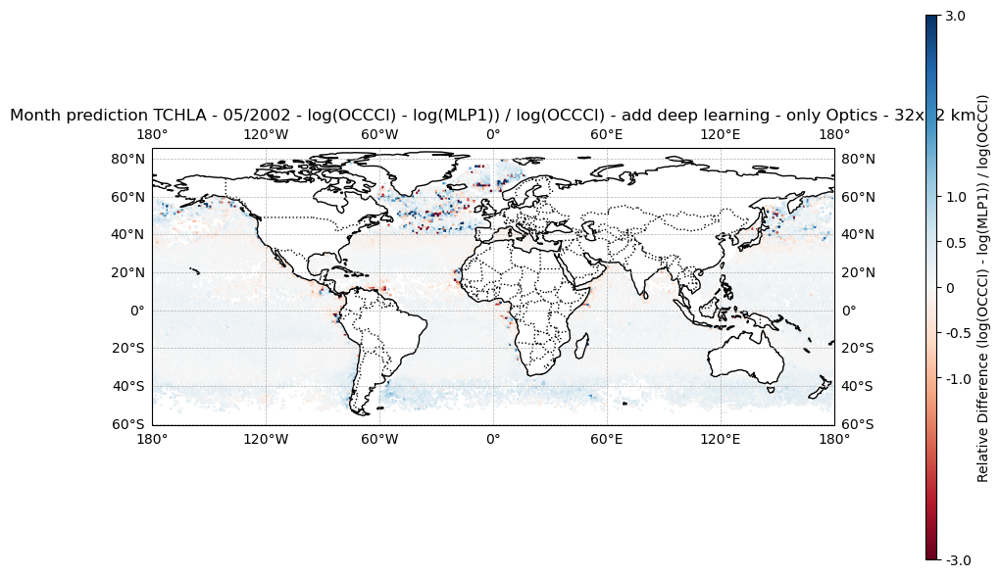

In [144]:
def plot_predictions_difference_frac(ax, longitudes, latitudes, values, title):
    # Masquer les NaN
    mask = ~np.isnan(values)

    # Masquer la Mer Noire (approximativement entre 27E-42E et 40N-47N)
    black_sea_mask = ~((longitudes >= 27) & (longitudes <= 42) &
                       (latitudes >= 40) & (latitudes <= 47))

    # Masque combiné
    mask = mask & black_sea_mask
    norm = mcolors.Normalize(vmin=-3, vmax=3)

    scatter = ax.scatter(longitudes[mask], latitudes[mask], c=values[mask], cmap='RdBu', s=1,
                         transform=ccrs.PlateCarree(), norm=norm)   

    ax.coastlines(resolution='110m', color='black')
    ax.add_feature(cfeat.BORDERS, linestyle=':', edgecolor='black')
    ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5)
    ax.set_title(title)

    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.1, aspect=50)
    cbar.set_label('Relative Difference (log(OCCCI) - log(MLP1)) / log(OCCCI)')
    cbar.set_ticks([-3.0, -1.0, -0.5,  0,  0.5, 1.0, 3.0])
    cbar.set_ticklabels(['-3.0', '-1.0', '-0.5', '0', '0.5','1.0','3.0'])

fig = plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
plot_predictions_difference_frac(
    ax,
    df_add_deep_099['lon'].values,
    df_add_deep_099['lat'].values,
    df_add_deep_099['diff_frac_log'].values,
    title=f'Month prediction TCHLA - {month:02d}/{year} - log(OCCCI) - log(MLP1)) / log(OCCCI) - add deep learning - only Optics - 32x32 km'
)
plt.tight_layout()
plt.show()

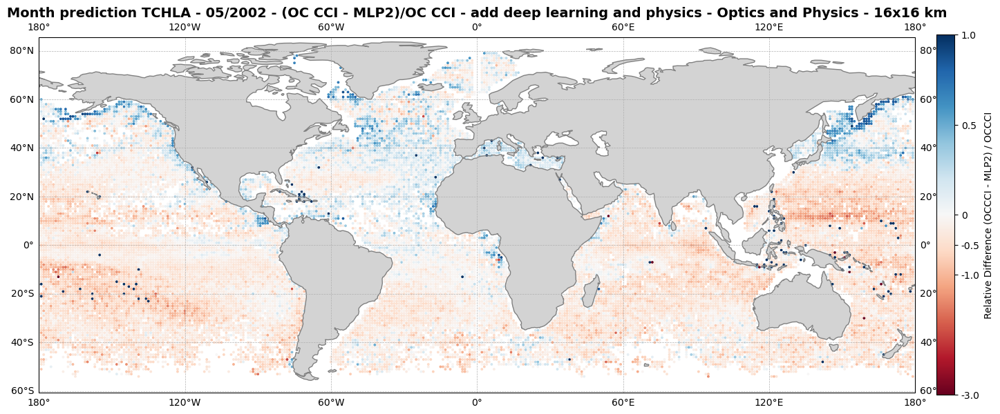

In [143]:
def plot_predictions_difference_frac(ax, longitudes, latitudes, values, title):
    # Masquer les NaN
    mask = ~np.isnan(values)

    # Masquer la Mer Noire (approximativement entre 27E-42E et 40N-47N)
    black_sea_mask = ~((longitudes >= 27) & (longitudes <= 42) &
                       (latitudes >= 40) & (latitudes <= 47))

    # Masque combiné
    mask = mask & black_sea_mask

    # Norme centrée sur 0, avec min=-3 et max=1
    norm = TwoSlopeNorm(vmin=-3, vcenter=0, vmax=1)

    scatter = ax.scatter(
        longitudes[mask], latitudes[mask],
        c=values[mask], cmap='RdBu', s=3,
        transform=ccrs.PlateCarree(), norm=norm
    )

    ax.add_feature(cfeat.LAND, facecolor='lightgray')
    ax.coastlines(color='gray')

    ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5)
    ax.set_title(title, fontsize=14, weight='bold')

    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.02, aspect=20, shrink=0.6)
    cbar.set_label('Relative Difference (OCCCI - MLP2) / OCCCI')
    cbar.set_ticks([-3.0, -1.0, -0.5, 0, 0.5, 1.0])
    cbar.set_ticklabels(['-3.0', '-1.0', '-0.5', '0', '0.5', '1.0'])
    
fig = plt.figure(figsize=(16, 9))
ax = plt.axes(projection=ccrs.PlateCarree())
plot_predictions_difference_frac(
    ax,
    df_add_deep_add_physics_099['lon'].values,
    df_add_deep_add_physics_099['lat'].values,
    df_add_deep_add_physics_099['diff_frac'].values,
    title=f'Month prediction TCHLA - {month:02d}/{year} - (OC CCI - MLP2)/OC CCI - add deep learning and physics - Optics and Physics - 16x16 km'
)
plt.tight_layout()
plt.show()

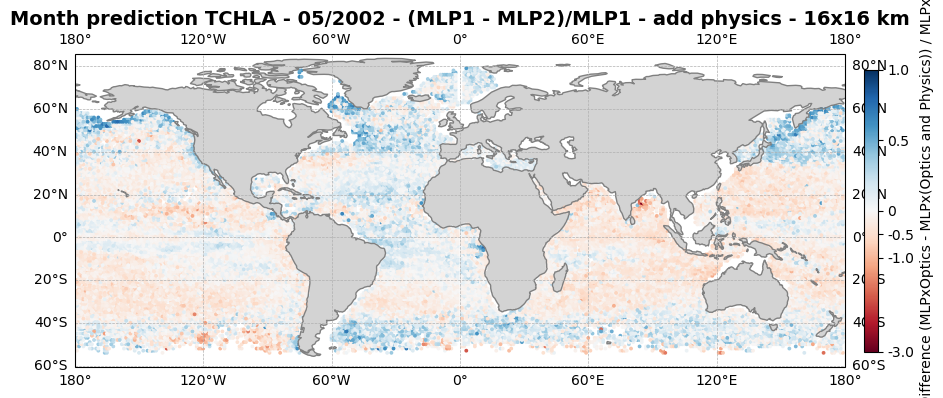

In [151]:
def plot_predictions_difference_frac(ax, longitudes, latitudes, values, title):
    # Masquer les NaN
    mask = ~np.isnan(values)

    # Masquer la Mer Noire (approximativement entre 27E-42E et 40N-47N)
    black_sea_mask = ~((longitudes >= 27) & (longitudes <= 42) &
                       (latitudes >= 40) & (latitudes <= 47))

    # Masque combiné
    mask = mask & black_sea_mask

    # Norme centrée sur 0, avec min=-3 et max=1
    norm = TwoSlopeNorm(vmin=-3, vcenter=0, vmax=1)

    scatter = ax.scatter(
        longitudes[mask], latitudes[mask],
        c=values[mask], cmap='RdBu', s=3,
        transform=ccrs.PlateCarree(), norm=norm
    )

    ax.add_feature(cfeat.LAND, facecolor='lightgray')
    ax.coastlines(color='gray')

    ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5)
    ax.set_title(title, fontsize=14, weight='bold')

    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.02, aspect=20, shrink=0.6)
    cbar.set_label('Relative Difference (MLPxOptics - MLPx(Optics and Physics)) / MLPxOptics')
    cbar.set_ticks([-3.0, -1.0, -0.5, 0, 0.5, 1.0])
    cbar.set_ticklabels(['-3.0', '-1.0', '-0.5', '0', '0.5', '1.0'])
    
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
plot_predictions_difference_frac(
    ax,
    df_add_physics_099['lon'].values,
    df_add_physics_099['lat'].values,
    df_add_physics_099['diff_frac'].values,
    title=f'Month prediction TCHLA - {month:02d}/{year} - (MLP1 - MLP2)/MLP1 - add physics - 16x16 km'
)
plt.tight_layout()
plt.show()

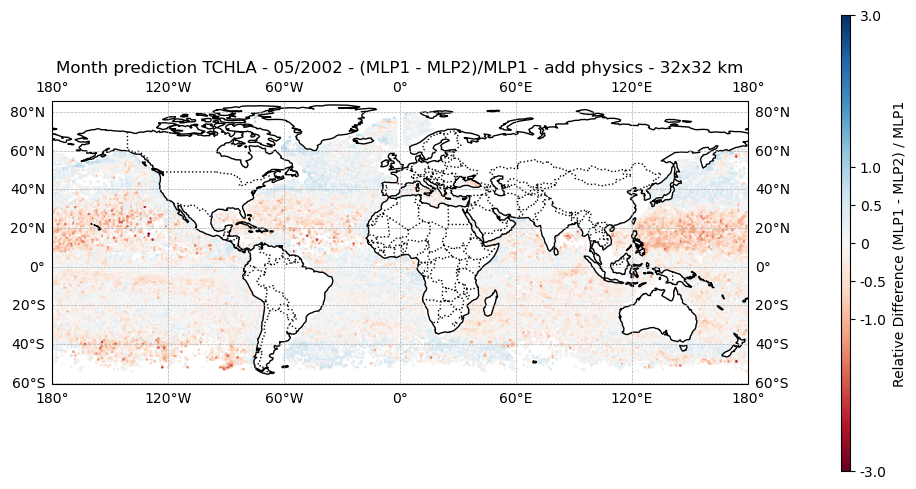

In [37]:
def plot_predictions_difference_frac(ax, longitudes, latitudes, values, title):
    mask = ~np.isnan(values)

    norm = mcolors.Normalize(vmin=-3, vmax=3)

    scatter = ax.scatter(longitudes[mask], latitudes[mask], c=values[mask], cmap='RdBu', s=1,
                         transform=ccrs.PlateCarree(), norm=norm)   

    ax.coastlines(resolution='110m', color='black')
    ax.add_feature(cfeat.BORDERS, linestyle=':', edgecolor='black')
    ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5)
    ax.set_title(title)

    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.1, aspect=50)
    cbar.set_label('Relative Difference (MLP1 - MLP2) / MLP1')
    cbar.set_ticks([-3.0, -1.0, -0.5,  0,  0.5, 1.0, 3.0])
    cbar.set_ticklabels(['-3.0', '-1.0', '-0.5', '0', '0.5','1.0','3.0'])

fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
plot_predictions_difference_frac(
    ax,
    df_add_physics_05['lon'].values,
    df_add_physics_05['lat'].values,
    df_add_physics_05['diff_frac'].values,
    title=f'Month prediction TCHLA - {month:02d}/{year} - (MLP1 - MLP2)/MLP1 - add physics - 32x32 km'
)
plt.tight_layout()
plt.show()

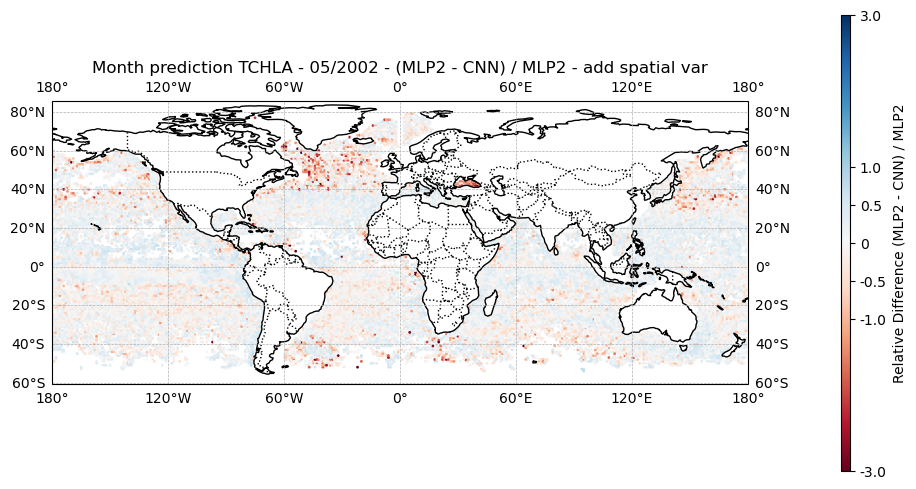

In [38]:
def plot_predictions_difference_frac(ax, longitudes, latitudes, values, title):
    mask = ~np.isnan(values)

    norm = mcolors.Normalize(vmin=-3, vmax=3)

    scatter = ax.scatter(longitudes[mask], latitudes[mask], c=values[mask], cmap='RdBu', s=1,
                         transform=ccrs.PlateCarree(), norm=norm)   

    ax.coastlines(resolution='110m', color='black')
    ax.add_feature(cfeat.BORDERS, linestyle=':', edgecolor='black')
    ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5)
    ax.set_title(title)

    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.1, aspect=50)
    cbar.set_label('Relative Difference (MLP2 - CNN) / MLP2')
    cbar.set_ticks([-3.0, -1.0, -0.5,  0,  0.5, 1.0, 3.0])
    cbar.set_ticklabels(['-3.0', '-1.0', '-0.5', '0', '0.5','1.0','3.0'])

fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
plot_predictions_difference_frac(
    ax,
    df_add_spatial_var['lon'].values,
    df_add_spatial_var['lat'].values,
    df_add_spatial_var['diff_frac'].values,
    title=f'Month prediction TCHLA - {month:02d}/{year} - (MLP2 - CNN) / MLP2 - add spatial var'
)
plt.tight_layout()
plt.show()

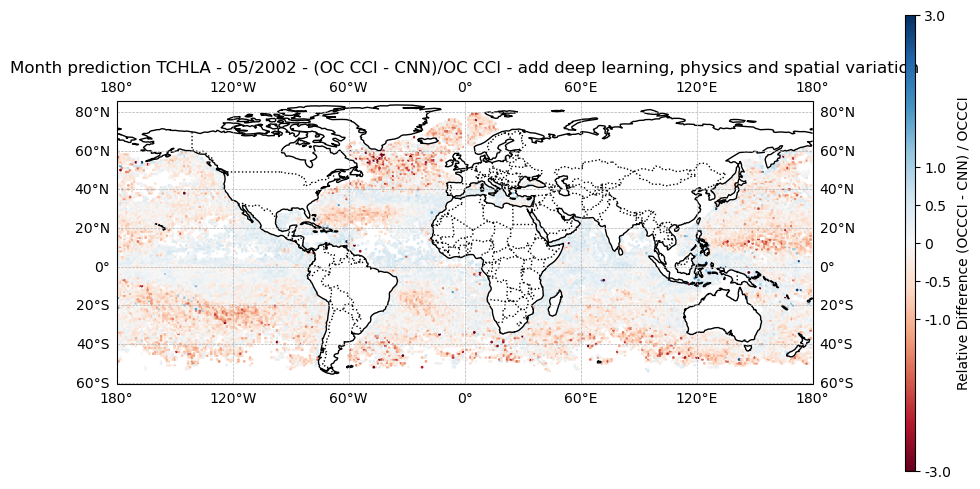

In [39]:
def plot_predictions_difference_frac(ax, longitudes, latitudes, values, title):
    mask = ~np.isnan(values)

    norm = mcolors.Normalize(vmin=-3, vmax=3)

    scatter = ax.scatter(longitudes[mask], latitudes[mask], c=values[mask], cmap='RdBu', s=1,
                         transform=ccrs.PlateCarree(), norm=norm)   

    ax.coastlines(resolution='110m', color='black')
    ax.add_feature(cfeat.BORDERS, linestyle=':', edgecolor='black')
    ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5)
    ax.set_title(title)

    cbar = plt.colorbar(scatter, orientation='vertical', pad=0.1, aspect=50)
    cbar.set_label('Relative Difference (OCCCI - CNN) / OCCCI')
    cbar.set_ticks([-3.0, -1.0, -0.5,  0,  0.5, 1.0, 3.0])
    cbar.set_ticklabels(['-3.0', '-1.0', '-0.5', '0', '0.5','1.0','3.0'])

fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
plot_predictions_difference_frac(
    ax,
    df_add_deep_add_physics_add_spatial_var['lon'].values,
    df_add_deep_add_physics_add_spatial_var['lat'].values,
    df_add_deep_add_physics_add_spatial_var['diff_frac'].values,
    title=f'Month prediction TCHLA - {month:02d}/{year} - (OC CCI - CNN)/OC CCI - add deep learning, physics and spatial variation'
)
plt.tight_layout()
plt.show()